分析目的：
1.根据Airbnb数据在纽约市地图上的分布情况比较分析不同地区的房价

2.分析不同房型的房价是否有差异

数据来源于kaggle

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

Data = pd.read_csv(r"C:\Users\win10\Desktop\DA_project\AB_NYC\AB_NYC_2019.csv")
Data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [2]:
Data.shape

(48895, 16)

In [3]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [4]:
Data.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [5]:
Data.isnull().sum()/Data.shape[0]  #查看缺失值所占比例

id                                0.000000
name                              0.000327
host_id                           0.000000
host_name                         0.000429
neighbourhood_group               0.000000
neighbourhood                     0.000000
latitude                          0.000000
longitude                         0.000000
room_type                         0.000000
price                             0.000000
minimum_nights                    0.000000
number_of_reviews                 0.000000
last_review                       0.205583
reviews_per_month                 0.205583
calculated_host_listings_count    0.000000
availability_365                  0.000000
dtype: float64

In [6]:
#处理缺失值
#删除对房价影响不大的特征：'name','host_name'
#删除与分析内容无关的特征：'id'
data = Data.drop(['name','host_name','id'],axis=1)
#last_review按最早时间填补上次评论时间
earliest = min(data[data['last_review'].isnull() == False]['last_review'])
data['last_review'] = data['last_review'].fillna(earliest)
#用0填补reviews_per_month平均每月评论次数
data['reviews_per_month'] =data['reviews_per_month'].fillna(0)

In [7]:
data.head()

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,2011-03-28,0.00,1,365
3,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [8]:
data.to_excel(r"C:\Users\win10\Desktop\DA_project\AB_NYC\AB_NYC_2019_new.xls")
#储存为excel表格可以利用Tableau进行可视化分析

In [9]:
data_area = data['neighbourhood_group'].value_counts()
data_area

Manhattan        21661
Brooklyn         20104
Queens            5666
Bronx             1091
Staten Island      373
Name: neighbourhood_group, dtype: int64

In [10]:
data_rt = data['room_type'].value_counts()
data_rt

Entire home/apt    25409
Private room       22326
Shared room         1160
Name: room_type, dtype: int64

In [11]:
data['price'].describe([0.01,0.1,0.25,0.5,0.75,0.9,0.95,0.99]).T

count    48895.000000
mean       152.720687
std        240.154170
min          0.000000
1%          30.000000
10%         49.000000
25%         69.000000
50%        106.000000
75%        175.000000
90%        269.000000
95%        355.000000
99%        799.000000
max      10000.000000
Name: price, dtype: float64

In [ ]:
'''纽约市不同地区房价的比较'''

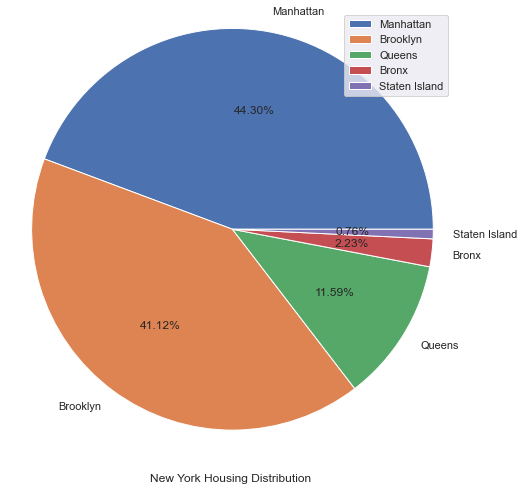

In [32]:
#房源分析
plt.figure(figsize=(8,8))
plt.pie(data_area,labels=data_area.index,autopct='%.2f%%',shadow=False)
plt.title('New York Housing Distribution',y=-0.1)
plt.axis('equal')
plt.legend(loc='best')
plt.show()

房源主要分布在Mahttan和Brooklyn地区，其中Manhattan地区房源最多，Staten Island地区房源最少
这样的分布是合理的，Manhattan是纽约五大行政区中人口最密集的区，Brooklyn是纽约人口最多的地区

In [14]:
#将不同地区的房价提取出来再合并进行对比分析

In [75]:
#将各个个地区的信息分开提取出来
area_info = []
for area in ['Brooklyn','Manhattan','Queens','Bronx','Staten Island']:
    area_info.append(data.loc[data['neighbourhood_group']== area])

#获取各个地区的房价的描述性统计
price_sum = []
for i in area_info:
    price_sum.append(i['price'].describe())

In [76]:
#将各个地区的房价的描述性统计合并 
price_list = pd.DataFrame(price_sum)
price_list.index = ['Brooklyn','Manhattan','Queens','Bronx','Staten Island']
price_list = price_list.T
price_list


,Brooklyn,Manhattan,Queens,Bronx,Staten Island
count,20104.000000,21661.000000,5666.000000,1091.000000,373.000000
mean,124.383207,196.875814,99.517649,87.496792,114.812332
std,186.873538,291.383183,167.102155,106.709349,277.620403
min,0.000000,0.000000,10.000000,0.000000,13.000000
25%,60.000000,95.000000,50.000000,45.000000,50.000000
50%,90.000000,150.000000,75.000000,65.000000,75.000000
75%,150.000000,220.000000,110.000000,99.000000,110.000000
max,10000.000000,10000.000000,10000.000000,2500.000000,5000.000000


<AxesSubplot:xlabel='neighbourhood_group', ylabel='price'>

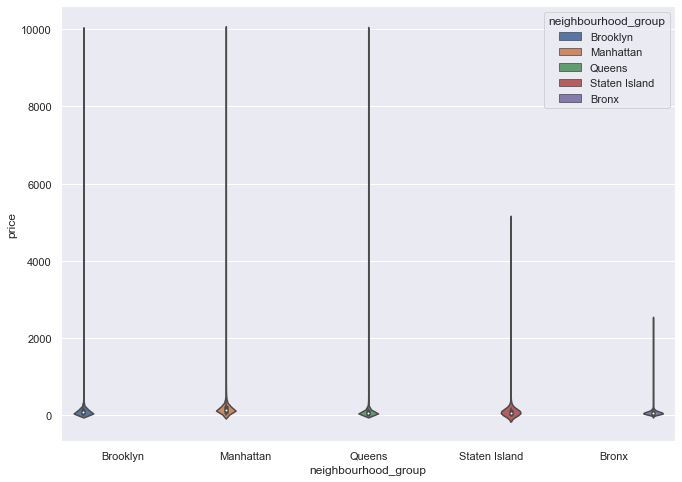

In [17]:
data1 = data
sns.set(rc={'figure.figsize':(11,8)})
sns.violinplot(x='neighbourhood_group', y='price', data=data1, hue='neighbourhood_group')

In [18]:
#400以下的房源占总体房源的95%以上
(data['price']<400).sum() / data.shape[0]

0.9593414459556192

小结：
1.Manhattan房价均值最高
2.Manhattan的房源占比最高
3.由于受极值点影响较大，所以在后续可视化探索中为了研究整体趋势使用房价在400以下的房源数据

In [19]:
#绘制小提琴图观察每个区房价的平均值

<AxesSubplot:xlabel='neighbourhood_group', ylabel='price'>

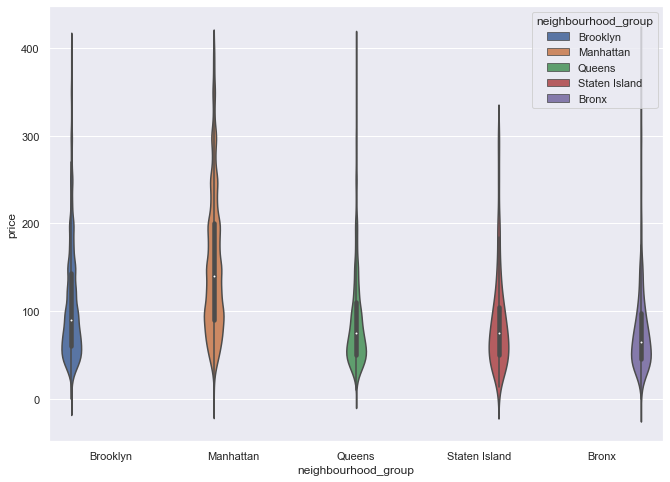

In [20]:
data1 = data[data['price']<400]
sns.set(rc={'figure.figsize':(11,8)})
sns.violinplot(x='neighbourhood_group', y='price', data=data1, hue='neighbourhood_group')

In [21]:
data1 = data[data['price']<400]
scat = px.scatter(data1, x = 'neighbourhood_group', y = 'price', color = 'neighbourhood_group',marginal_y = 'box')
scat.show()

In [22]:
#小结：
#1.Manhattan和Brooklyn地区的价格分布较广，Queens，Bronx和Staten Island地区的价格则相对比较集中
#2.Brooklyn和Bronx地区大部分房源价格较低，由于Brooklyn地区高价房源分布较广，所以Brooklyn地区房价均值较高
#3.Queens,Bronx和Staten Island地区大部分房源价格相近

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

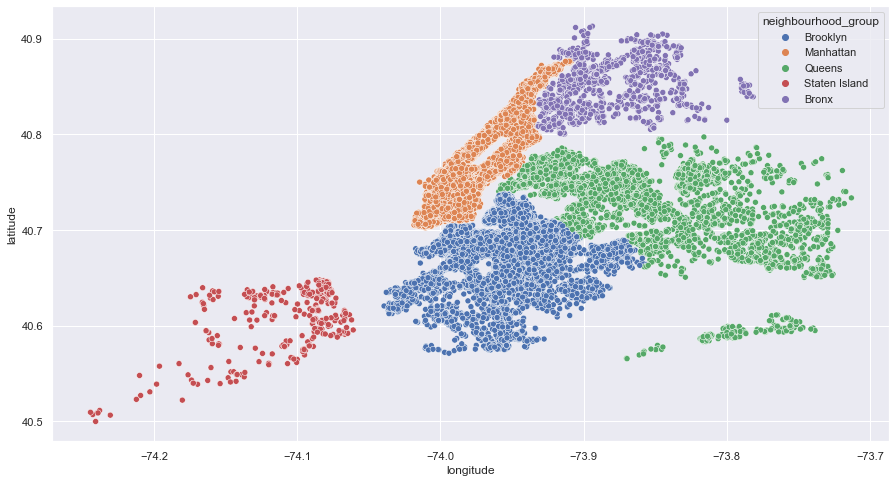

In [23]:
#绘制散点图标注各个地区房源在纽约市地图上的位置
plt.figure(figsize=(15, 8))
sns.scatterplot(x=data.longitude,y=data.latitude,hue=data.neighbourhood_group)

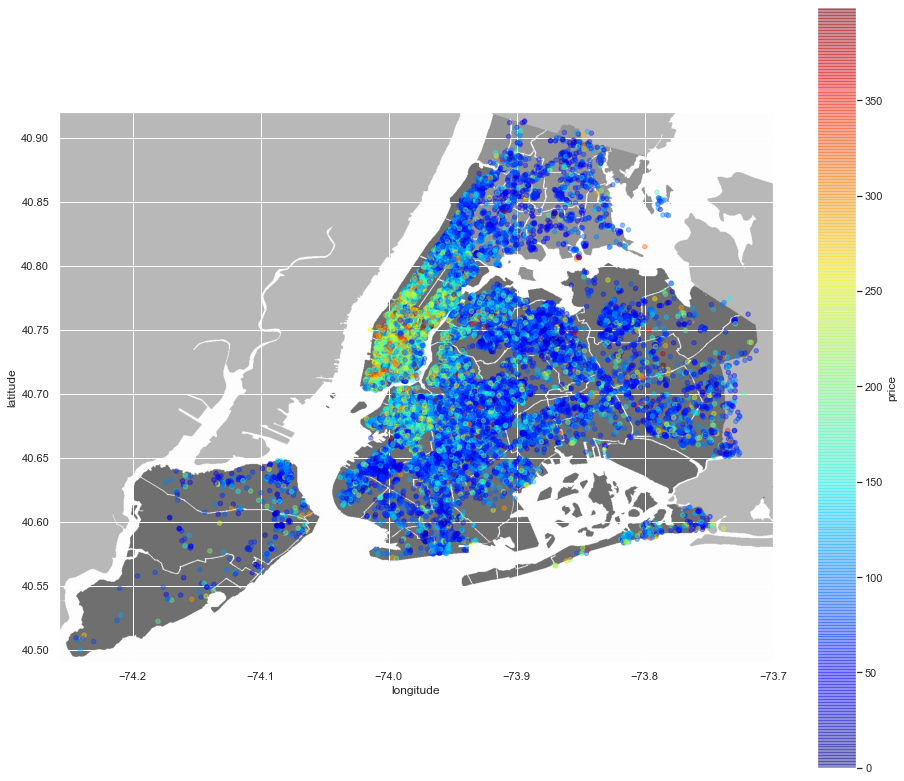

In [25]:
import matplotlib.image as mpimg
import urllib
plt.figure(figsize=(16,14))
i=r'C:\Users\win10\Desktop\DA_project\AB_NYC\New_York_City_.png'
nyc_img=plt.imread(i,'rb')
plt.imshow(nyc_img,zorder=0,extent=[-74.258, -73.7, 40.49,40.92])
ax=plt.gca()

#在纽约地图上绘制散点图，观察各个地区的房价分布情况
data1.plot(kind='scatter', x='longitude', y='latitude', c='price', ax=ax, 
           cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.4, zorder=5)

plt.show()

    结合以上两幅图可以看到：
    1.价格最高的红色区域对应的即是Mahttan地区，房源密度高价格也偏高
    2.Brooklyn和Queens地区出现的高价房源靠近Mahttan地区，不排除是因为Mahttan地区的带动

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

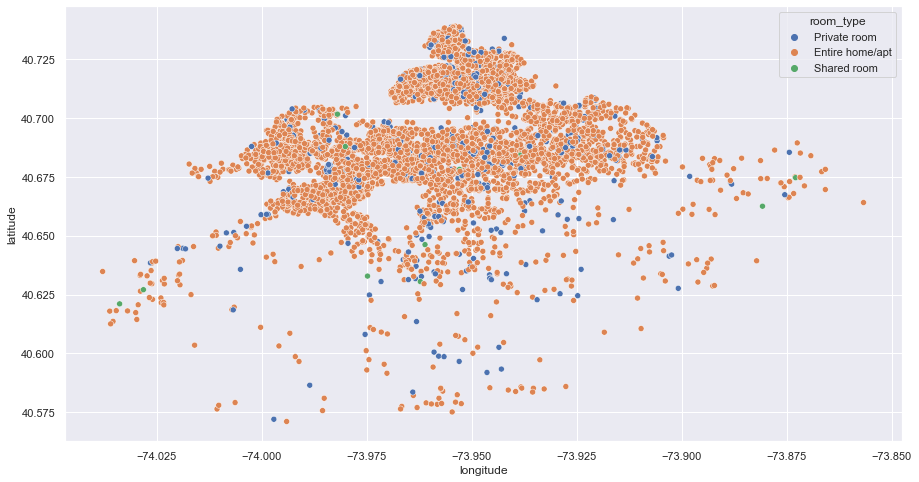

In [47]:
#查看Brooklyn房价高于130的房源位置
data_br = sub1[sub1['price'] > 130]

plt.figure(figsize=(15, 8))
sns.scatterplot(x=data.longitude,y=data.latitude,hue=data_br.room_type)

In [53]:
#查看Brooklyn地区Entire home/apt在所有高价房中的占比
(data_br['room_type'] == 'Entire home/apt').sum() / data_br['room_type'] .count() 

0.9071851225697379

In [ ]:
#可以看见Brooklyn高价房源集中在靠近Manhattan的海岸线附近，并且Entire home/apt房源占绝大部分

In [ ]:
'''分析不同房间类型对房价影响'''

<AxesSubplot:xlabel='neighbourhood_group', ylabel='price'>

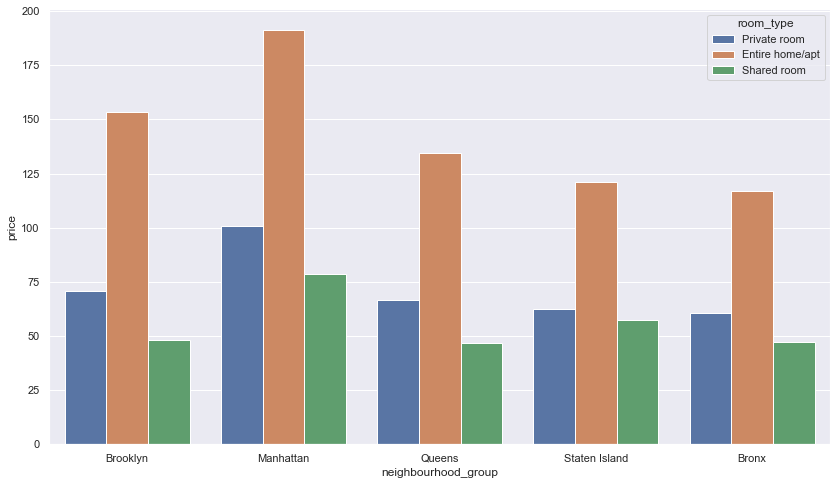

In [58]:
#房型分析
data1 = data[data['price']<400]
plt.figure(figsize=(14,8))
sns.barplot(x=data1['neighbourhood_group'],y=data1['price'],hue=data1['room_type'],ci=None)

In [27]:
data1 = data[data['price']<400]
scat = px.scatter(data1, x = 'room_type', y = 'price', color = 'room_type',marginal_y = 'box')
scat.show()

In [77]:
#统计各个地区不同房型的房源数量
listing_sum = []
for i in area_info:
    listing_sum.append(i.groupby('room_type').count()['host_id'])
#将各个地区不同房型数量进行合并统计
listing_list = pd.DataFrame(listing_sum)
listing_list.index = ['Brooklyn','Manhattan','Queens','Bronx','Staten Island']
listing_list = listing_list.T
listing_list['room_sum'] = listing_list.apply(lambda x: x.sum(), axis=1)
listing_list


,Brooklyn,Manhattan,Queens,Bronx,Staten Island,room_sum
room_type,,,,,,
Entire home/apt,9559,13199,2096,379,176,25409
Private room,10132,7982,3372,652,188,22326
Shared room,413,480,198,60,9,1160



对不同类型公寓的分析表明：
1.从房源的数量角度考虑，Manhattan和Brooklyn最多，其中Entire home/apt数量最多
2.根据对不同房型价格的分析可以发现在各个地区Entire home/apt的价格都远高于其他房型
3.在Manhattan地区Entire home/apt房源最多，是Manhattan房价均值较高的原因之一
4.在Queens、Bronx和Staten Island这种房价较低的地区，Private room更多，Shared room则相对较少
5.Manhattan和Brooklyn这种房价较高的地区Shared room 相比其他地区更多一些


In [ ]:
'''
结论：
1.不同房型的房价有明显差异，Entire home/apt价格最高，其次是Private room，最后是Shared room；
2.Manhatttan地区的房价由于市场需求可以称得上“一枝独秀”，处于绝对领先地位，靠近Manhattan的沿海岸Brooklyn地区的房价也因Manhattan地区的带动高于其他地区，
除此之外其他地区对于房价的影响并不明显。
3.目前Manhattan以及Brooklyn沿海岸地区的Entire home/apt房源较多，价位也较高，说明租客对此处需求较高，相应的，竞争也会比较激烈

对于租客而言，Manhattan地区的Entire home/apt价格较高，处于性价比的考虑，Private room是不错的选择
对于房东而言，目前Manhattan的Entire home/apt房源较多，可以尝试将带有多个房间的Entire home/apt划分成Private room出租，以性价比吸引租客或许更具有竞争力
'''